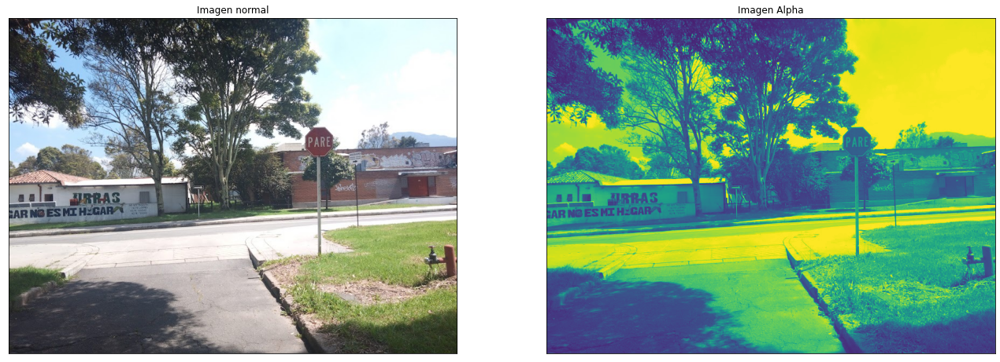

In [31]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
img = cv2.imread('Pare.jpeg',-1)
img2 = cv2.imread('ProhibidoParquear.jpeg',-1)
img1 = cv2.imread('Pare.jpeg',0)
ima = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
ima2 = cv2.cvtColor(img2,cv2.COLOR_BGR2RGB)
plt.figure(1);
plt.subplot(1,2,1),plt.imshow(ima), plt.title('Imagen normal'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(img1), plt.title('Imagen Alpha'), plt.xticks([]), plt.yticks([])
plt.subplots_adjust(top=4, bottom=0.1, left=0.10, right=3, hspace=0.1, wspace=0.2)

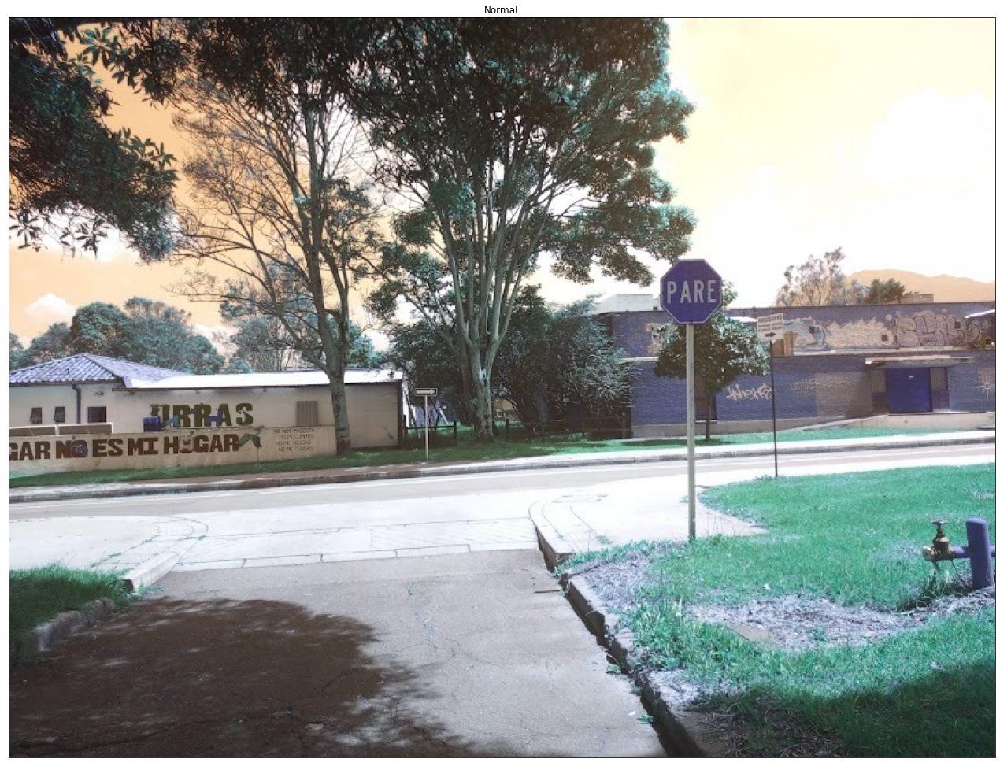

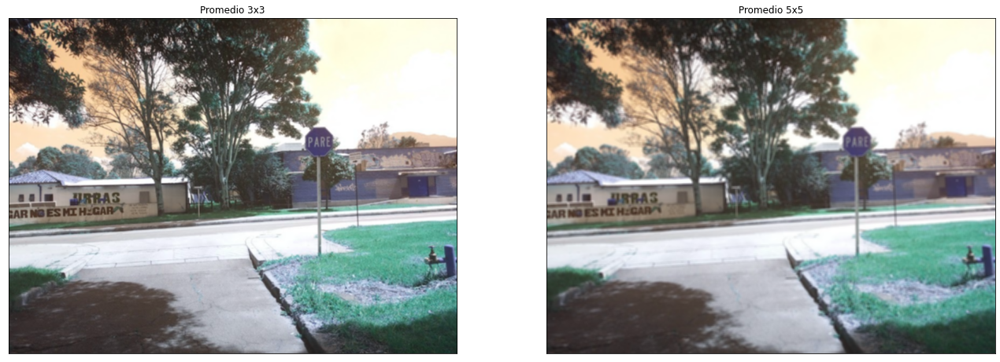

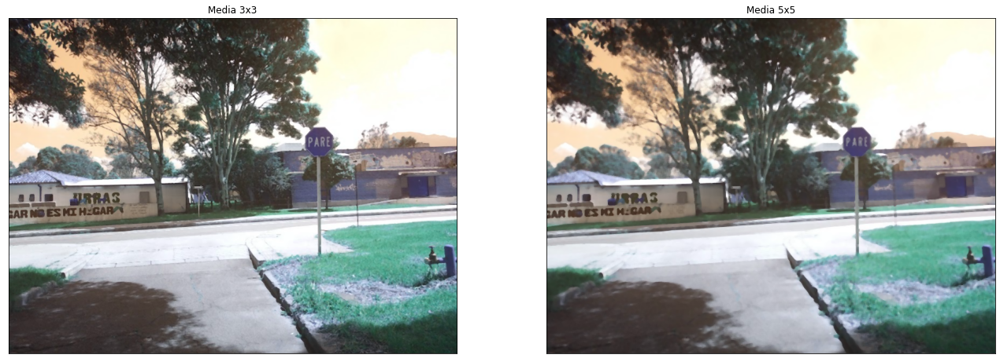

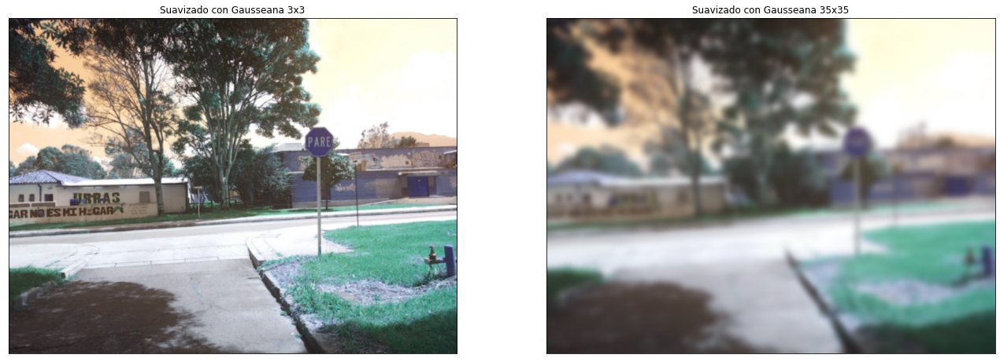

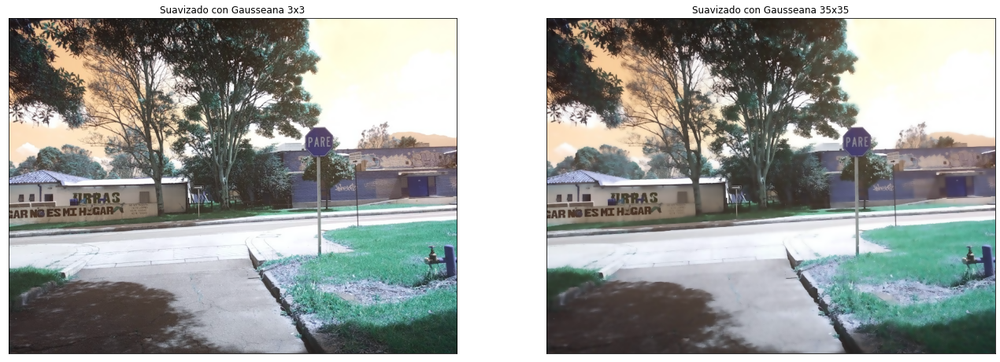

In [5]:
kernel1 = np.ones((3, 3)) / 9
kernel2 = np.ones((5, 5)) / 25
imagen21 = cv2.filter2D(img, -1,kernel1)
imagen22 = cv2.filter2D(img, -1,kernel2)

imagen24 = cv2.blur(img,(5,5)) #promediado
imagen25 = cv2.blur(img,(3,3)) #promediado
imagen26 = cv2.medianBlur(img,3)  #medio
imagen27 = cv2.medianBlur(img,5)  #medio
imagen28 = cv2.GaussianBlur(img,(3,3),0) #gausssiano
imagen29 = cv2.GaussianBlur(img,(35,35),0) #gausssiano
imagen30 = cv2.bilateralFilter(img,9,9,9) #bilineal
imagen31 = cv2.bilateralFilter(img,9,75,75) #bilineal



plt.figure(1);
plt.imshow(img,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Normal')
plt.subplots_adjust(top=4, bottom=0.1, left=0.10, right=3, hspace=0.1, wspace=0.2)
plt.figure(5);
plt.subplot(1,2,1),plt.imshow(imagen21,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Promediada 3x3')
plt.subplot(1,2,2),plt.imshow(imagen22,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Promediada 5x5')
plt.subplots_adjust(top=4, bottom=0.1, left=0.10, right=3, hspace=0.1, wspace=0.2)
plt.figure(2);
plt.subplot(1,2,1),plt.imshow(imagen25,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Promedio 3x3')
plt.subplot(1,2,2),plt.imshow(imagen24,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Promedio 5x5')
plt.subplots_adjust(top=4, bottom=0.1, left=0.10, right=3, hspace=0.1, wspace=0.2)
plt.figure(3);
plt.subplot(1,2,1),plt.imshow(imagen26,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Media 3x3')
plt.subplot(1,2,2),plt.imshow(imagen27,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Media 5x5')
plt.subplots_adjust(top=4, bottom=0.1, left=0.10, right=3, hspace=0.1, wspace=0.2)
plt.figure(4);
plt.subplot(1,2,1),plt.imshow(imagen28,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Suavizado con Gausseana 3x3')
plt.subplot(1,2,2),plt.imshow(imagen29,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Suavizado con Gausseana 35x35')
plt.subplots_adjust(top=4, bottom=0.1, left=0.10, right=3, hspace=0.1, wspace=0.2)
plt.figure(5);
plt.subplot(1,2,1),plt.imshow(imagen30,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Suavizado con Gausseana 3x3')
plt.subplot(1,2,2),plt.imshow(imagen31,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Suavizado con Gausseana 35x35')
plt.subplots_adjust(top=4, bottom=0.1, left=0.10, right=3, hspace=0.1, wspace=0.2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


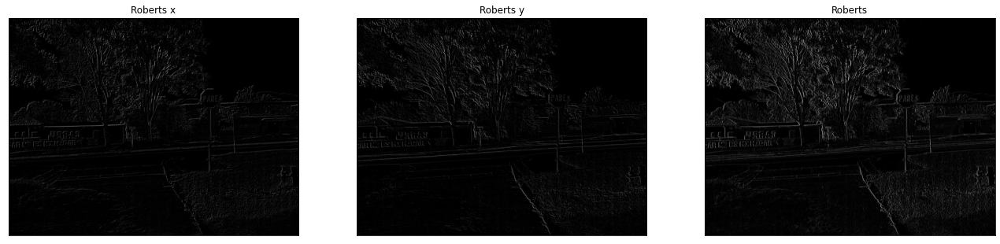

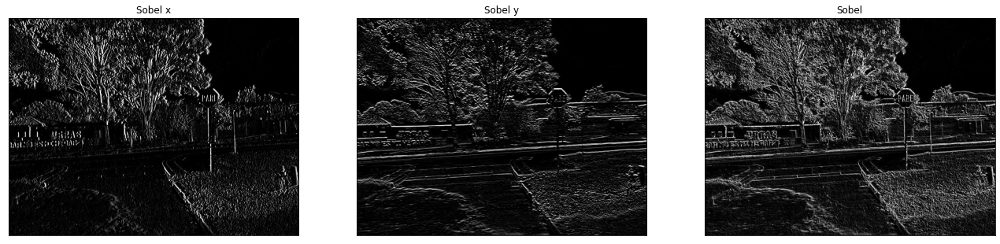

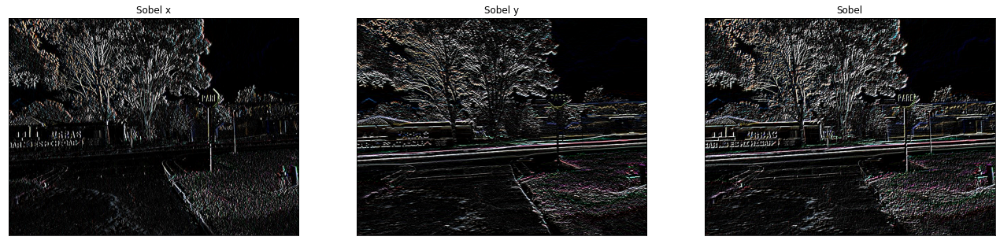

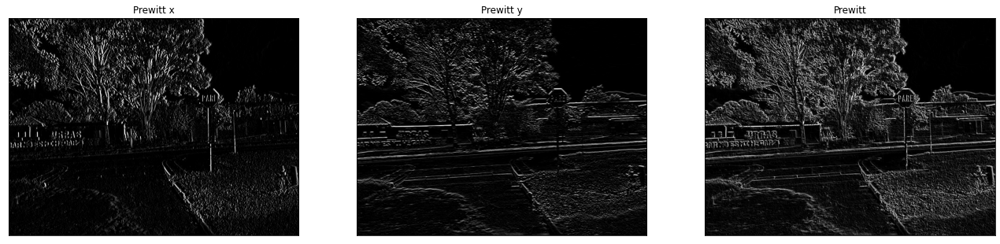

In [11]:
#img_sobel2 = cv2.Sobel(img,cv2.CV_8U,1,1,ksize=5)

image = cv2.resize(img1,(800,800))


 # Kernel de convolución personalizado
 # Roberts edge operator
print()
kernel_Roberts_x = np.array([
    [1, 0],
    [0, -1]
    ])
kernel_Roberts_y = np.array([
    [0, -1],
    [1, 0]
    ])
 # Operador de borde Sobel
kernel_Sobel_x = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]])
kernel_Sobel_y = np.array([
    [1, 2, 1],
    [0, 0, 0],
    [-1, -2, -1]])
 # Operador de borde de precontrol
kernel_Prewitt_x = np.array([
    [-1, 0, 1],
    [-1, 0, 1],
    [-1, 0, 1]])
kernel_Prewitt_y = np.array([
    [1, 1, 1],
    [0, 0, 0],
    [-1, -1, -1]])
 # Operador de detección de bordes de Kirsch
def kirsch(image):
    m,n = image.shape
    list=[]
    kirsch = np.zeros((m,n))
    for i in range(2,m-1):
        for j in range(2,n-1):
            d1 = np.square(5 * image[i - 1, j - 1] + 5 * image[i - 1, j] + 5 * image[i - 1, j + 1] -
                  3 * image[i, j - 1] - 3 * image[i, j + 1] - 3 * image[i + 1, j - 1] -
                  3 * image[i + 1, j] - 3 * image[i + 1, j + 1])
            d2 = np.square((-3) * image[i - 1, j - 1] + 5 * image[i - 1, j] + 5 * image[i - 1, j + 1] -
                  3 * image[i, j - 1] + 5 * image[i, j + 1] - 3 * image[i + 1, j - 1] -
                  3 * image[i + 1, j] - 3 * image[i + 1, j + 1])
            d3 = np.square((-3) * image[i - 1, j - 1] - 3 * image[i - 1, j] + 5 * image[i - 1, j + 1] -
                  3 * image[i, j - 1] + 5 * image[i, j + 1] - 3 * image[i + 1, j - 1] -
                  3 * image[i + 1, j] + 5 * image[i + 1, j + 1])
            d4 = np.square((-3) * image[i - 1, j - 1] - 3 * image[i - 1, j] - 3 * image[i - 1, j + 1] -
                  3 * image[i, j - 1] + 5 * image[i, j + 1] - 3 * image[i + 1, j - 1] +
                  5 * image[i + 1, j] + 5 * image[i + 1, j + 1])
            d5 = np.square((-3) * image[i - 1, j - 1] - 3 * image[i - 1, j] - 3 * image[i - 1, j + 1] - 3
                  * image[i, j - 1] - 3 * image[i, j + 1] + 5 * image[i + 1, j - 1] +
                  5 * image[i + 1, j] + 5 * image[i + 1, j + 1])
            d6 = np.square((-3) * image[i - 1, j - 1] - 3 * image[i - 1, j] - 3 * image[i - 1, j + 1] +
                  5 * image[i, j - 1] - 3 * image[i, j + 1] + 5 * image[i + 1, j - 1] +
                  5 * image[i + 1, j] - 3 * image[i + 1, j + 1])
            d7 = np.square(5 * image[i - 1, j - 1] - 3 * image[i - 1, j] - 3 * image[i - 1, j + 1] +
                  5 * image[i, j - 1] - 3 * image[i, j + 1] + 5 * image[i + 1, j - 1] -
                  3 * image[i + 1, j] - 3 * image[i + 1, j + 1])
            d8 = np.square(5 * image[i - 1, j - 1] + 5 * image[i - 1, j] - 3 * image[i - 1, j + 1] +
                  5 * image[i, j - 1] - 3 * image[i, j + 1] - 3 * image[i + 1, j - 1] -
                  3 * image[i + 1, j] - 3 * image[i + 1, j + 1])

                         # El primer método: tome el valor máximo en todas las direcciones, el efecto no es bueno, use otro método
            list=[d1, d2, d3, d4, d5, d6, d7, d8]
            #kirsch[i,j]= int(np.sqrt(max(list)))
                         # El segundo método: redondear el módulo en todas las direcciones
            kirsch[i, j] =int(np.sqrt(d1+d2+d3+d4+d5+d6+d7+d8))
    for i in range(m):
        for j in range(n):
            if kirsch[i,j]>127:
                kirsch[i,j]=255
            else:
                kirsch[i,j]=0
    return kirsch

 # Detección de bordes canny k es el tamaño del núcleo gaussiano, t1, t2 son el tamaño del umbral
def Canny(image,k,t1,t2):
    img = cv2.GaussianBlur(image, (k, k), 0)
    canny = cv2.Canny(img, t1, t2)
    return canny


 # Kernel de convolución de Laplace
kernel_Laplacian_1 = np.array([
    [0, 1, 0],
    [1, -4, 1],
    [0, 1, 0]])
kernel_Laplacian_2 = np.array([
    [1, 1, 1],
    [1, -8, 1],
    [1, 1, 1]])
 # Los siguientes dos núcleos de convolución no tienen invariancia de rotación
kernel_Laplacian_3 = np.array([
    [2, -1, 2],
    [-1, -4, -1],
    [2, 1, 2]])
kernel_Laplacian_4 = np.array([
    [-1, 2, -1],
    [2, -4, 2],
    [-1, 2, -1]])
 # 5 * 5 plantilla de convolución LoG
kernel_LoG = np.array([
    [0, 0, -1, 0, 0],
    [0, -1, -2, -1, 0],
    [-1, -2, 16, -2, -1],
    [0, -1, -2, -1, 0],
    [0, 0, -1, 0, 0]])
 # Convolución

output_11 = cv2.filter2D(image, -1, kernel_Roberts_x)
output_12 = cv2.filter2D(image, -1, kernel_Roberts_y)
output_21 = cv2.filter2D(image, -1, kernel_Sobel_x)
output_22 = cv2.filter2D(image, -1, kernel_Sobel_y)
img_sobelx = cv2.Sobel(img,cv2.CV_16S,1,0)
img_sobely = cv2.Sobel(img,cv2.CV_16S,0,1)
img_sobel = img_sobelx + img_sobely
output_31 = cv2.filter2D(image, -1, kernel_Prewitt_x)
output_32 = cv2.filter2D(image, -1, kernel_Prewitt_y)
output_41 = cv2.filter2D(image, -1, kernel_Laplacian_1)
output_42 = cv2.filter2D(image, -1, kernel_Laplacian_2)
output_43 = cv2.filter2D(image, -1, kernel_Laplacian_3)
output_5 = Canny(image,3,50,150)
output_6 = kirsch(image)
 # Mostrar efecto de afilado
image = cv2.resize(image, (800, 600))
output_11 = cv2.resize(output_11, (800, 600))
output_12 = cv2.resize(output_12, (800, 600))
output_13 = output_12 + output_11
output_21 = cv2.resize(output_21, (800, 600))
output_22 = cv2.resize(output_22, (800, 600))
output_23 = output_21 + output_22
output_31 = cv2.resize(output_31, (800, 600))
output_32 = cv2.resize(output_32, (800, 600))
output_33 = output_31 + output_32
output_41 = cv2.resize(output_41, (800, 600))
output_42 = cv2.resize(output_42, (800, 600))
output_43 = cv2.resize(output_42, (800, 600))
output_5 = cv2.resize(output_5, (800, 600))
output_6 = cv2.resize(output_6, (800, 600))


plt.figure(2);
plt.subplot(1,3,1),plt.imshow(output_11,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Roberts x')
plt.subplot(1,3,2),plt.imshow(output_12,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Roberts y')
plt.subplot(1,3,3),plt.imshow(output_13,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Roberts')
plt.subplots_adjust(top=4, bottom=0.1, left=0.10, right=3, hspace=0.1, wspace=0.2)
plt.figure(3);
plt.subplot(1,3,1),plt.imshow(output_21,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Sobel x')
plt.subplot(1,3,2),plt.imshow(output_22,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Sobel y')
plt.subplot(1,3,3),plt.imshow(output_23,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Sobel')
plt.subplots_adjust(top=4, bottom=0.1, left=0.10, right=3, hspace=0.1, wspace=0.2)
plt.figure(4);
plt.subplot(1,3,1),plt.imshow(img_sobelx,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Sobel x')
plt.subplot(1,3,2),plt.imshow(img_sobely,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Sobel y')
plt.subplot(1,3,3),plt.imshow(img_sobel,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Sobel')
plt.subplots_adjust(top=4, bottom=0.1, left=0.10, right=3, hspace=0.1, wspace=0.2)
plt.figure(5);
plt.subplot(1,3,1),plt.imshow(output_31,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Prewitt x')
plt.subplot(1,3,2),plt.imshow(output_32,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Prewitt y')
plt.subplot(1,3,3),plt.imshow(output_33,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Prewitt')   
plt.subplots_adjust(top=4, bottom=0.1, left=0.10, right=3, hspace=0.1, wspace=0.2)


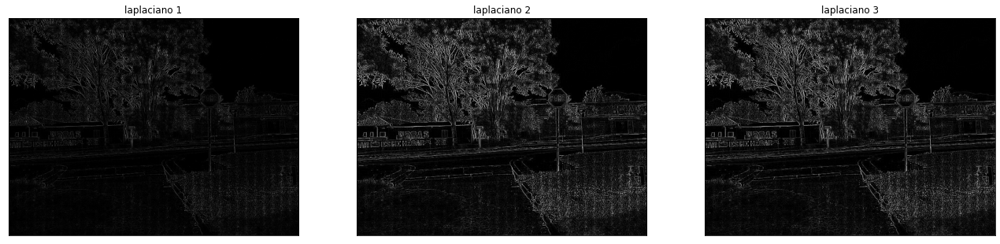

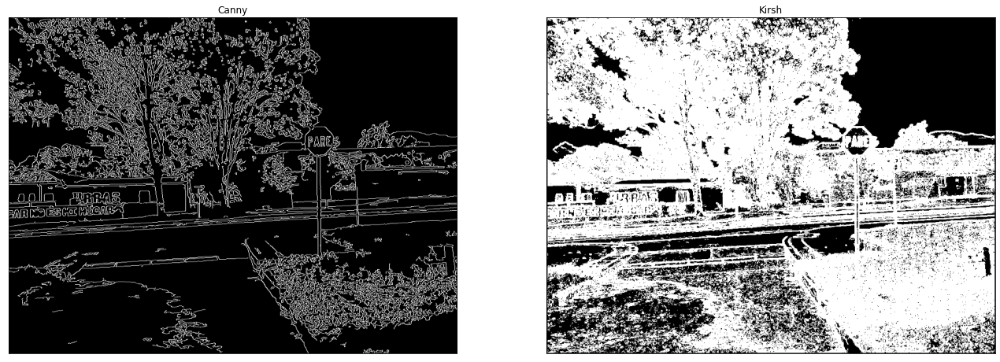

In [12]:
plt.figure(6);
plt.subplot(1,3,1),plt.imshow(output_41,'gray'),plt.xticks([]), plt.yticks([]),plt.title('laplaciano 1')
plt.subplot(1,3,2),plt.imshow(output_42,'gray'),plt.xticks([]), plt.yticks([]),plt.title('laplaciano 2')
plt.subplot(1,3,3),plt.imshow(output_43,'gray'),plt.xticks([]), plt.yticks([]),plt.title('laplaciano 3')
plt.subplots_adjust(top=4, bottom=0.1, left=0.10, right=3, hspace=0.1, wspace=0.2)
plt.figure(7);
plt.subplot(1,2,1),plt.imshow(output_5,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Canny')
plt.subplot(1,2,2),plt.imshow(output_6,'gray'),plt.xticks([]), plt.yticks([]),plt.title('Kirsh')
plt.subplots_adjust(top=4, bottom=0.1, left=0.10, right=3, hspace=0.1, wspace=0.2)

# Filtrado en Color


## Espacio RGB
RGB (rojo, verde y azul) es un espacio definido de acuerdo con los colores reconocidos por el ojo humano y puede representar la mayoría de los colores. El espacio de color RGB se basa en el principio de mezcla de colores aditiva: los colores rojo, verde y azul se superponen continuamente al negro para obtener luz blanca.

## Espacio de color HSV
HSV es un método de representación de puntos del espacio de color RGB en un cono invertido

H (Matiz) [matiz]: El matiz es el atributo básico del color, que es equivalente al nombre del color.

S (Saturación) [Saturación]: La pureza del color [Oscuridad], cuanto mayor es el valor, más puro es el color, menor es el valor, el gris gradualmente toma un valor de 0-100%

V (Valor) [Brillo]: Toma 0-max [El rango de valores de la computadora hsv está relacionado con la longitud de almacenamiento]

El espacio HSV se describe mediante un espacio cónico, V = 0 en el vértice del cono, H y S son indefinidos, lo que representa el negro. No hay definición en la superficie superior del cono V = max, S = 0, H no está definido, representa el blanco


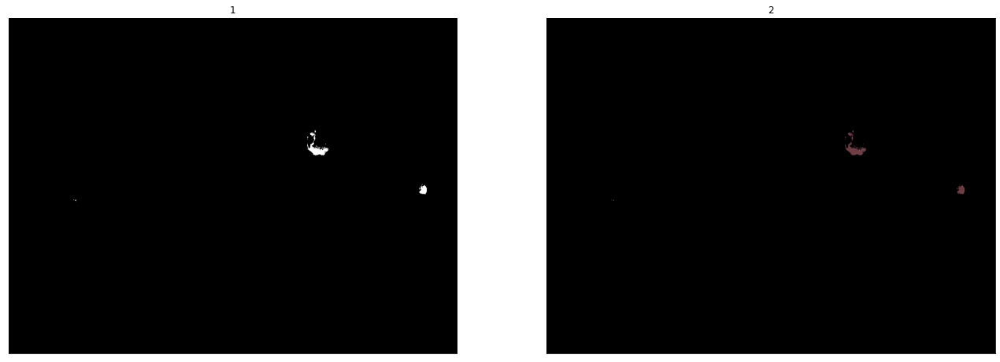

In [36]:
img_hsv=cv2.cvtColor(ima,cv2.COLOR_RGB2HSV)

umbral_bajo= (150,100,100)
umbral_alto= (180,255,255)

mask= cv2.inRange(img_hsv, umbral_bajo, umbral_alto)
res= cv2.bitwise_and(ima,ima,mask=mask)
plt.figure(1);
plt.subplot(1,2,1);plt.imshow(mask, cmap='gray'),plt.title('1'),plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2);plt.imshow(res),plt.title('2'),plt.xticks([]), plt.yticks([])
plt.subplots_adjust(top=4, bottom=0.1, left=0.10, right=3, hspace=0.1, wspace=0.2)

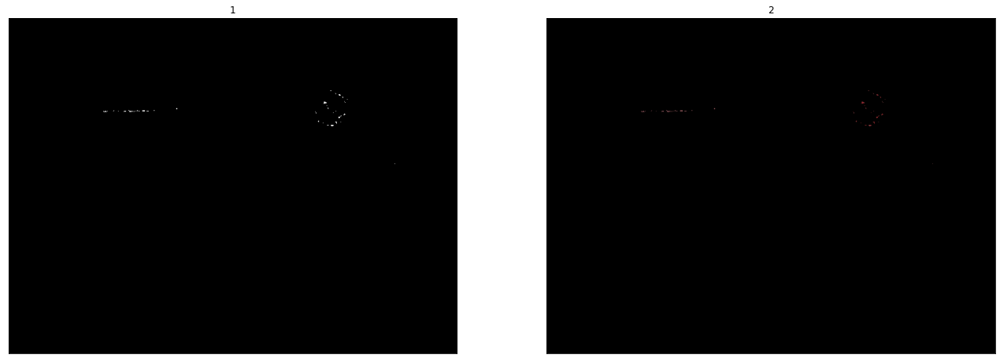

In [33]:
img_hsv=cv2.cvtColor(ima2,cv2.COLOR_RGB2HSV)

umbral_bajo= (150,100,100)
umbral_alto= (180,255,255)

mask= cv2.inRange(img_hsv, umbral_bajo, umbral_alto)
res= cv2.bitwise_and(ima2,ima2,mask=mask) 
plt.figure(1);
plt.subplot(1,2,1);plt.imshow(mask, cmap='gray'),plt.title('1'),plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2);plt.imshow(res),plt.title('2'),plt.xticks([]), plt.yticks([])
plt.subplots_adjust(top=4, bottom=0.1, left=0.10, right=3, hspace=0.1, wspace=0.2)